In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_excel('DAILY indicators copia.xlsx',engine='openpyxl')
df.rename(columns={'key_0':'Date'},inplace=True)
df.index = pd.to_datetime(df['Date'],format='%Y-%m-%d')
df.drop(['Date'],axis=1,inplace=True)
df

,High,Low,Open,Close,Volume,Adj Close,Price close,EMA,SMA,WMA,MA,RSI,SlowD,SlowK,ATR,ROC
Date,,,,,,,,,,,,,,,,
1999-12-31,104.684509,101.935944,104.385757,103.130974,3002334,60.405579,61.780476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,110.898659,106.955070,107.492828,110.898659,10823694,64.955292,66.433693,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,109.464630,105.999046,108.986618,107.134323,8606279,62.750420,64.178642,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,114.483749,107.194077,107.970840,110.898659,13318927,64.955292,66.433693,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,113.706978,108.508606,112.810707,108.986618,8338607,63.835339,65.288307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-07,137.820007,136.270004,137.449997,137.240005,3759000,135.606552,135.606552,131.533455,132.651808,132.879527,132.651808,58.931005,82.408906,78.442040,3.013104,6.536247
2022-02-08,137.520004,135.779999,137.229996,137.020004,4181800,135.389175,135.389175,131.782211,132.829666,133.056132,132.829666,58.574335,76.567142,66.274871,2.922168,0.675979
2022-02-09,138.350006,136.830002,137.839996,137.789993,5393500,136.149994,136.149994,132.064004,132.999619,133.270346,132.999619,59.463690,69.411898,63.518784,2.822014,2.629220


In [3]:
df.dropna(axis=0,inplace=True)
df

,High,Low,Open,Close,Volume,Adj Close,Price close,EMA,SMA,WMA,MA,RSI,SlowD,SlowK,ATR,ROC
Date,,,,,,,,,,,,,,,,
2000-02-11,114.184990,109.524376,113.826485,110.301147,6013872,64.676430,66.145264,66.544556,66.544556,66.647200,66.544556,55.255583,72.987851,62.893079,4.555714,3.526196
2000-02-14,111.257172,109.464630,110.898659,110.958412,4753024,65.061829,66.539436,66.544226,66.703188,66.646870,66.703188,55.691200,66.168044,51.430031,4.358345,3.505276
2000-02-15,112.272942,108.867111,110.779160,111.974190,5415665,65.657440,67.148605,66.583218,66.727019,66.675607,66.727019,56.371078,51.334738,39.681102,4.290308,6.589348
2000-02-16,112.153442,110.181641,111.376671,110.659653,4149377,64.886665,66.360268,66.568834,66.799740,66.651945,66.799740,55.235098,43.569139,39.596284,4.124700,2.089676
2000-02-17,113.647224,110.659653,111.376671,111.615677,5478425,65.447205,66.933594,66.592367,66.816403,66.660581,66.816403,55.904425,42.060506,46.904131,4.043477,-0.215274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-07,137.820007,136.270004,137.449997,137.240005,3759000,135.606552,135.606552,131.533455,132.651808,132.879527,132.651808,58.931005,82.408906,78.442040,3.013104,6.536247
2022-02-08,137.520004,135.779999,137.229996,137.020004,4181800,135.389175,135.389175,131.782211,132.829666,133.056132,132.829666,58.574335,76.567142,66.274871,2.922168,0.675979
2022-02-09,138.350006,136.830002,137.839996,137.789993,5393500,136.149994,136.149994,132.064004,132.999619,133.270346,132.999619,59.463690,69.411898,63.518784,2.822014,2.629220


In [4]:
corr = df.corr()
corr

,High,Low,Open,Close,Volume,Adj Close,Price close,EMA,SMA,WMA,MA,RSI,SlowD,SlowK,ATR,ROC
High,1.000000,0.999367,0.999562,0.999579,-0.384166,0.918903,0.924799,0.917330,0.914970,0.918984,0.914970,0.150138,0.059105,0.052205,0.161780,0.062741
Low,0.999367,1.000000,0.999555,0.999564,-0.402325,0.919346,0.925231,0.916846,0.914346,0.918613,0.914346,0.156771,0.063125,0.055892,0.137639,0.068997
Open,0.999562,0.999555,1.000000,0.999137,-0.392721,0.919094,0.924969,0.917776,0.915385,0.919503,0.915385,0.148455,0.058891,0.049110,0.150290,0.059951
Close,0.999579,0.999564,0.999137,1.000000,-0.393180,0.919303,0.925203,0.916643,0.914193,0.918349,0.914193,0.157830,0.063166,0.059227,0.150081,0.071167
Volume,-0.384166,-0.402325,-0.392721,-0.393180,1.000000,-0.425347,-0.425437,-0.408970,-0.405448,-0.410027,-0.405448,-0.141180,-0.056305,-0.055645,0.281474,-0.131463
Adj Close,0.918903,0.919346,0.919094,0.919303,-0.425347,1.000000,0.999883,0.994254,0.991717,0.994968,0.991717,0.116910,0.046061,0.043049,0.128909,0.057029
Price close,0.924799,0.925231,0.924969,0.925203,-0.425437,0.999883,1.000000,0.994257,0.991717,0.995007,0.991717,0.118659,0.046809,0.043756,0.129918,0.057657
EMA,0.917330,0.916846,0.917776,0.916643,-0.408970,0.994254,0.994257,1.000000,0.999518,0.999632,0.999518,0.028315,-0.014830,-0.017606,0.154230,-0.026067
SMA,0.914970,0.914346,0.915385,0.914193,-0.405448,0.991717,0.991717,0.999518,1.000000,0.999177,1.000000,0.016098,-0.023491,-0.024088,0.156959,-0.041834
WMA,0.918984,0.918613,0.919503,0.918349,-0.410027,0.994968,0.995007,0.999632,0.999177,1.000000,0.999177,0.044593,-0.014750,-0.017979,0.147244,-0.026374


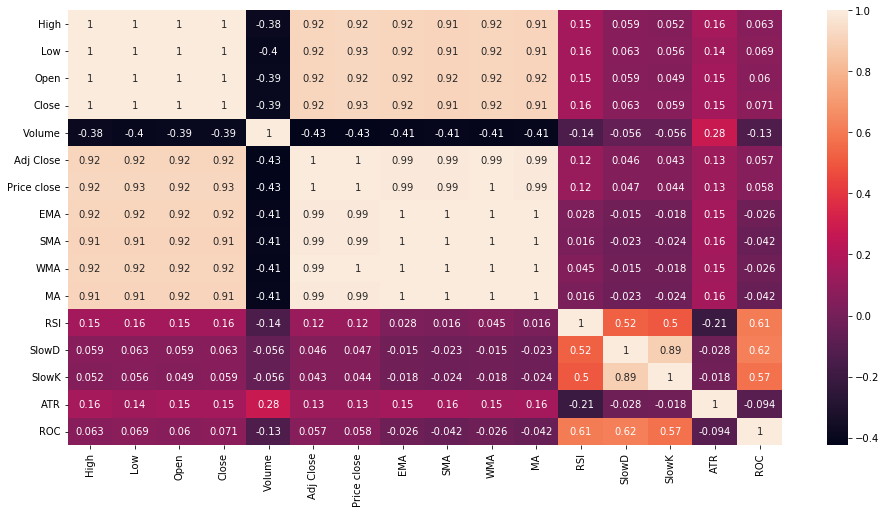

In [5]:
fig = plt.figure(figsize=(16, 8))
sns.heatmap(corr, annot=True, annot_kws={"fontsize":10})

In [6]:
df.columns

Index(['High', 'Low', 'Open', 'Close', 'Volume', 'Adj Close', 'Price close',
       'EMA', 'SMA', 'WMA', 'MA', 'RSI', 'SlowD', 'SlowK', 'ATR', 'ROC'],
      dtype='object')

In [7]:
df = df[['Open', 'Volume', 'Adj Close','WMA', 'MA','RSI','SlowD', 'SlowK']]

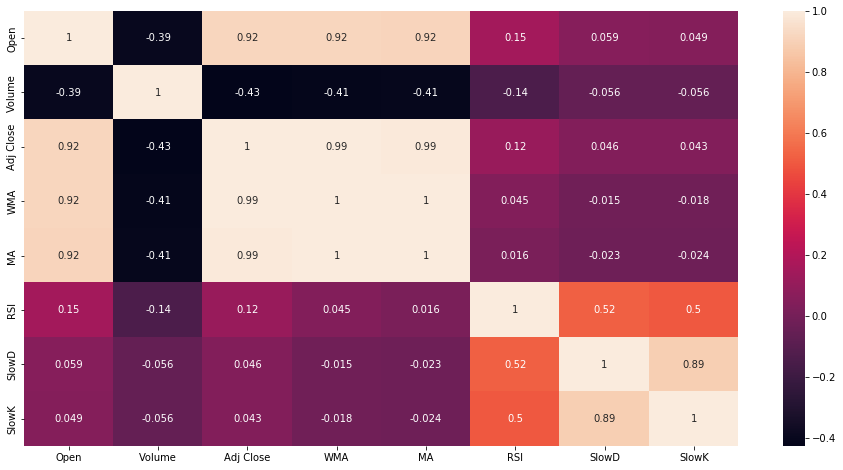

In [8]:
corr2 = df.corr()
corr2
fig = plt.figure(figsize=(16, 8))
sns.heatmap(corr2, annot=True, annot_kws={"fontsize":10})

In [9]:
df

,Open,Volume,Adj Close,WMA,MA,RSI,SlowD,SlowK
Date,,,,,,,,
2000-02-11,113.826485,6013872,64.676430,66.647200,66.544556,55.255583,72.987851,62.893079
2000-02-14,110.898659,4753024,65.061829,66.646870,66.703188,55.691200,66.168044,51.430031
2000-02-15,110.779160,5415665,65.657440,66.675607,66.727019,56.371078,51.334738,39.681102
2000-02-16,111.376671,4149377,64.886665,66.651945,66.799740,55.235098,43.569139,39.596284
2000-02-17,111.376671,5478425,65.447205,66.660581,66.816403,55.904425,42.060506,46.904131
...,...,...,...,...,...,...,...,...
2022-02-07,137.449997,3759000,135.606552,132.879527,132.651808,58.931005,82.408906,78.442040
2022-02-08,137.229996,4181800,135.389175,133.056132,132.829666,58.574335,76.567142,66.274871
2022-02-09,137.839996,5393500,136.149994,133.270346,132.999619,59.463690,69.411898,63.518784


In [10]:
q_70 = int(len(df.index) * .7)
df_train = df[:q_70]
df_test = df[q_70:]

In [11]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
scaler = scaler.fit(df_train)
df_scaled = scaler.transform(df_train)
df_scaled.shape

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/sklearn/preprocessing/data.py:334: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


(3875, 8)

In [12]:
def Create_X_y(i):
    global X
    X=[]
    global y
    y=[]
    
    windowsize = [5,10,20,30,60]
    n_feature = 1 
    n_past = windowsize[i]
    
    for i in range(n_past,len(df_scaled)-n_feature+1):
        X.append(df_scaled[i-n_past:i, 0:df_scaled.shape[1]])
        y.append(df_scaled[i+n_feature-1:i+n_feature, 2])  #nella terza colonna (2 index) sta il adj close
    return X, y

In [13]:
Create_X_y(0)

([array([[0.40074973, 0.11751924, 0.29800615, 0.28644221, 0.27453328,
          0.65551751, 0.7323172 , 0.62215098],
         [0.381696  , 0.0875191 , 0.30144991, 0.28643911, 0.27604566,
          0.66278378, 0.6605462 , 0.50542608],
         [0.38091832, 0.10328573, 0.30677204, 0.28670875, 0.27627285,
          0.67412444, 0.50444192, 0.38579014],
         [0.38480681, 0.07315615, 0.29988473, 0.28648673, 0.27696616,
          0.6551758 , 0.42271751, 0.38492646],
         [0.38480681, 0.10477902, 0.30489347, 0.28656776, 0.27712503,
          0.66634048, 0.4068408 , 0.45934015]]),
  array([[0.381696  , 0.0875191 , 0.30144991, 0.28643911, 0.27604566,
          0.66278378, 0.6605462 , 0.50542608],
         [0.38091832, 0.10328573, 0.30677204, 0.28670875, 0.27627285,
          0.67412444, 0.50444192, 0.38579014],
         [0.38480681, 0.07315615, 0.29988473, 0.28648673, 0.27696616,
          0.6551758 , 0.42271751, 0.38492646],
         [0.38480681, 0.10477902, 0.30489347, 0.28656776, 0.27

In [14]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 8), (3870, 5, 8), (3870, 1))

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError

model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [16]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3870 samples
Epoch 1/20
3870/3870 [==============================] - 5s 1ms/sample - loss: 0.0239 - mean_absolute_error: 0.0907
Epoch 2/20
3870/3870 [==============================] - 2s 429us/sample - loss: 6.6557e-04 - mean_absolute_error: 0.0194
Epoch 3/20
3870/3870 [==============================] - 2s 432us/sample - loss: 4.3506e-04 - mean_absolute_error: 0.0154
Epoch 4/20
3870/3870 [==============================] - 2s 426us/sample - loss: 3.7321e-04 - mean_absolute_error: 0.0140
Epoch 5/20
3870/3870 [==============================] - 2s 425us/sample - loss: 3.5568e-04 - mean_absolute_error: 0.0136
Epoch 6/20
3870/3870 [==============================] - 2s 426us/sample - loss: 3.2841e-04 - mean_absolute_error: 0.0131
Epoch 7/20
3870/3870 [==============================] - 2s 424us/sample - loss: 3.1592e-04 - mean_absolute_error: 0.0128
Epoch 8/20
3870/3870 [==============================] - 2s 429us/sample - loss: 3.0360e-04 - mean_absolute_error: 0.0125
Epoch 9/20
3870/

In [17]:
dataset_total = pd.concat((df_train,df_test), axis=0)

In [18]:
inputs = dataset_total[len(dataset_total)-len(df_test)-5:].values

In [19]:
inputs.shape

(1667, 8)

In [20]:
inputs = scaler.transform(inputs)

In [21]:
inputs

array([[0.68686614, 0.04542581, 0.75564375, ..., 0.52655768, 0.16697812,
        0.357799  ],
       [0.67927585, 0.05107791, 0.75338586, ..., 0.51829096, 0.35819437,
        0.58436101],
       [0.68618176, 0.0627778 , 0.75507942, ..., 0.5253904 , 0.55935636,
        0.73060942],
       ...,
       [0.55702506, 0.10275834, 0.93666333, ..., 0.72571056, 0.69468422,
        0.62852235],
       [0.54160159, 0.11667999, 0.91316286, ..., 0.65491316, 0.56187843,
        0.39498118],
       [0.53138428, 0.07379437, 0.90574632, ..., 0.63391381, 0.42001716,
        0.24480076]])

In [22]:
X_test = []
for i in range(5,len(inputs)):
    X_test.append(inputs[i-5:i, :]) #colonne tutte perchè è X , y solo il adj close

In [23]:
X_test

[array([[0.68686614, 0.04542581, 0.75564375, 0.77254529, 0.77773641,
         0.52655768, 0.16697812, 0.357799  ],
        [0.67927585, 0.05107791, 0.75338586, 0.77119742, 0.77579138,
         0.51829096, 0.35819437, 0.58436101],
        [0.68618176, 0.0627778 , 0.75507942, 0.77008921, 0.77416033,
         0.5253904 , 0.55935636, 0.73060942],
        [0.68033351, 0.04352436, 0.74353786, 0.76829281, 0.77258577,
         0.48290093, 0.64591536, 0.60905707],
        [0.68867045, 0.07895011, 0.74786583, 0.76689329, 0.77074464,
         0.50166867, 0.62472895, 0.5228624 ]]),
 array([[0.67927585, 0.05107791, 0.75338586, 0.77119742, 0.77579138,
         0.51829096, 0.35819437, 0.58436101],
        [0.68618176, 0.0627778 , 0.75507942, 0.77008921, 0.77416033,
         0.5253904 , 0.55935636, 0.73060942],
        [0.68033351, 0.04352436, 0.74353786, 0.76829281, 0.77258577,
         0.48290093, 0.64591536, 0.60905707],
        [0.68867045, 0.07895011, 0.74786583, 0.76689329, 0.77074464,
         

In [24]:
X_test = np.array(X_test)

In [25]:
X_test.shape

(1662, 5, 8)

In [26]:
test_predictions5 = model.predict(X_test)

In [27]:
forecast_copies = np.repeat(test_predictions5, df_scaled.shape[1], axis=-1)
y_pre5 = scaler.inverse_transform(forecast_copies)[:,2]  #2 perchè la colonna dei adj close è questa
y_pre5

array([115.46717, 115.54246, 117.19428, ..., 131.60728, 131.43161,
       130.55962], dtype=float32)

In [28]:
y_test = df_test['Adj Close'].values

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


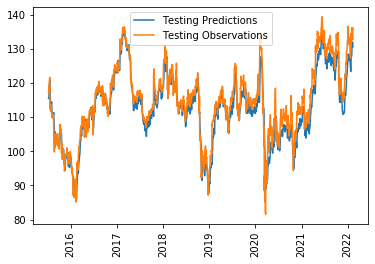

In [29]:
plt.plot(df_test.index, y_pre5)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [30]:
test_results5 = pd.DataFrame(data={'Test Predictions':y_pre5, 'Actuals':y_test},index=df_test.index)
test_results5

,Test Predictions,Actuals
Date,,
2015-07-10,115.467171,117.197418
2015-07-13,115.542458,118.903267
2015-07-14,117.194283,118.362709
2015-07-15,119.035667,118.306519
2015-07-16,119.741180,120.040489
...,...,...
2022-02-07,131.672729,135.606552
2022-02-08,131.927414,135.389175
2022-02-09,131.607285,136.149994


In [31]:
rmse5=np.sqrt(np.mean(((test_results5['Test Predictions']- test_results5['Actuals'])**2)))
mae5 = np.mean(np.abs(test_results5['Test Predictions']-test_results5['Actuals']))
MAPE5 = np.mean(np.abs(((test_results5['Test Predictions']-test_results5['Actuals'])/test_results5['Actuals'])*100))
from sklearn.metrics import r2_score
r2_5 = r2_score(test_results5['Actuals'], test_results5['Test Predictions'])
rmse5, mae5, MAPE5, r2_5

(3.53155843098529, 2.7288283842708796, 2.3857497573394815, 0.8858096741170634)

In [32]:
Create_X_y(1)

([array([[0.40074973, 0.11751924, 0.29800615, 0.28644221, 0.27453328,
          0.65551751, 0.7323172 , 0.62215098],
         [0.381696  , 0.0875191 , 0.30144991, 0.28643911, 0.27604566,
          0.66278378, 0.6605462 , 0.50542608],
         [0.38091832, 0.10328573, 0.30677204, 0.28670875, 0.27627285,
          0.67412444, 0.50444192, 0.38579014],
         [0.38480681, 0.07315615, 0.29988473, 0.28648673, 0.27696616,
          0.6551758 , 0.42271751, 0.38492646],
         [0.38480681, 0.10477902, 0.30489347, 0.28656776, 0.27712503,
          0.66634048, 0.4068408 , 0.45934015],
         [0.37702978, 0.165404  , 0.28360508, 0.28516374, 0.27687357,
          0.60875818, 0.38334822, 0.31759736],
         [0.35680956, 0.16494109, 0.27609143, 0.28325512, 0.27643982,
          0.58944533, 0.34672277, 0.27861237],
         [0.34747713, 0.15947815, 0.26482107, 0.28059319, 0.27477714,
          0.56107614, 0.22684238, 0.11135887],
         [0.33697815, 0.20120807, 0.27358679, 0.27864414, 0.2732

In [33]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 8), (3865, 10, 8), (3865, 1))

In [34]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [35]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3865 samples
Epoch 1/20
3865/3865 [==============================] - 6s 2ms/sample - loss: 0.0135 - mean_absolute_error: 0.0703
Epoch 2/20
3865/3865 [==============================] - 3s 778us/sample - loss: 6.7319e-04 - mean_absolute_error: 0.0195
Epoch 3/20
3865/3865 [==============================] - 3s 778us/sample - loss: 5.1162e-04 - mean_absolute_error: 0.0168
Epoch 4/20
3865/3865 [==============================] - 3s 776us/sample - loss: 4.3405e-04 - mean_absolute_error: 0.0153
Epoch 5/20
3865/3865 [==============================] - 3s 774us/sample - loss: 4.0720e-04 - mean_absolute_error: 0.0147
Epoch 6/20
3865/3865 [==============================] - 3s 779us/sample - loss: 3.7617e-04 - mean_absolute_error: 0.0141
Epoch 7/20
3865/3865 [==============================] - 3s 794us/sample - loss: 3.7555e-04 - mean_absolute_error: 0.0140
Epoch 8/20
3865/3865 [==============================] - 3s 806us/sample - loss: 3.5281e-04 - mean_absolute_error: 0.0136
Epoch 9/20
3865/

In [36]:
inputs = dataset_total[len(dataset_total)-len(df_test)-10:].values
inputs.shape

(1672, 8)

In [37]:
inputs = scaler.transform(inputs)
inputs

array([[0.70397565, 0.03438045, 0.76185404, ..., 0.53861921, 0.43039047,
        0.22396321],
       [0.69420768, 0.19707664, 0.75796518, ..., 0.52439116, 0.21981878,
        0.01941386],
       [0.67983581, 0.05692412, 0.742346  , ..., 0.47024124, 0.06762823,
        0.00203462],
       ...,
       [0.55702506, 0.10275834, 0.93666333, ..., 0.72571056, 0.69468422,
        0.62852235],
       [0.54160159, 0.11667999, 0.91316286, ..., 0.65491316, 0.56187843,
        0.39498118],
       [0.53138428, 0.07379437, 0.90574632, ..., 0.63391381, 0.42001716,
        0.24480076]])

In [38]:
X_test = []
for i in range(10,len(inputs)):
    X_test.append(inputs[i-10:i, :])

In [39]:
X_test = np.array(X_test)

In [40]:
test_predictions10 = model.predict(X_test)

In [41]:
forecast_copies = np.repeat(test_predictions10, df_scaled.shape[1], axis=-1)
y_pre10 = scaler.inverse_transform(forecast_copies)[:,2]  #2 perchè la colonna dei adj close è questa
y_pre10

array([114.324066, 114.02843 , 114.907   , ..., 130.41728 , 130.49301 ,
       129.63971 ], dtype=float32)

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


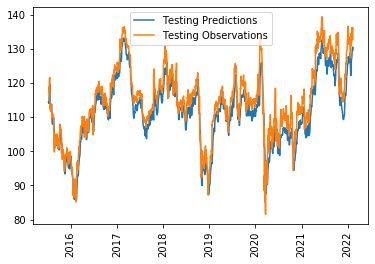

In [42]:
plt.plot(df_test.index, y_pre10)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [43]:
test_results10 = pd.DataFrame(data={'Test Predictions':y_pre10, 'Actuals':y_test},index=df_test.index)
test_results10

,Test Predictions,Actuals
Date,,
2015-07-10,114.324066,117.197418
2015-07-13,114.028427,118.903267
2015-07-14,114.906998,118.362709
2015-07-15,116.198471,118.306519
2015-07-16,117.114212,120.040489
...,...,...
2022-02-07,129.706558,135.606552
2022-02-08,130.364197,135.389175
2022-02-09,130.417282,136.149994


In [44]:
rmse10=np.sqrt(np.mean(((test_results10['Test Predictions']- test_results10['Actuals'])**2)))
mae10 = np.mean(np.abs(test_results10['Test Predictions']-test_results10['Actuals']))
MAPE10 = np.mean(np.abs(((test_results10['Test Predictions']-test_results10['Actuals'])/test_results10['Actuals'])*100))
r2_10 = r2_score(test_results10['Actuals'], test_results10['Test Predictions'])
rmse10, mae10, MAPE10, r2_10

(4.167377264140842, 3.4973695573680517, 3.0361220579932953, 0.8409908353624731)

In [45]:
Create_X_y(2)

([array([[0.40074973, 0.11751924, 0.29800615, 0.28644221, 0.27453328,
          0.65551751, 0.7323172 , 0.62215098],
         [0.381696  , 0.0875191 , 0.30144991, 0.28643911, 0.27604566,
          0.66278378, 0.6605462 , 0.50542608],
         [0.38091832, 0.10328573, 0.30677204, 0.28670875, 0.27627285,
          0.67412444, 0.50444192, 0.38579014],
         [0.38480681, 0.07315615, 0.29988473, 0.28648673, 0.27696616,
          0.6551758 , 0.42271751, 0.38492646],
         [0.38480681, 0.10477902, 0.30489347, 0.28656776, 0.27712503,
          0.66634048, 0.4068408 , 0.45934015],
         [0.37702978, 0.165404  , 0.28360508, 0.28516374, 0.27687357,
          0.60875818, 0.38334822, 0.31759736],
         [0.35680956, 0.16494109, 0.27609143, 0.28325512, 0.27643982,
          0.58944533, 0.34672277, 0.27861237],
         [0.34747713, 0.15947815, 0.26482107, 0.28059319, 0.27477714,
          0.56107614, 0.22684238, 0.11135887],
         [0.33697815, 0.20120807, 0.27358679, 0.27864414, 0.2732

In [46]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 8), (3855, 20, 8), (3855, 1))

In [47]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [48]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3855 samples
Epoch 1/20
3855/3855 [==============================] - 9s 2ms/sample - loss: 0.0262 - mean_absolute_error: 0.0889
Epoch 2/20
3855/3855 [==============================] - 6s 1ms/sample - loss: 7.3001e-04 - mean_absolute_error: 0.0198
Epoch 3/20
3855/3855 [==============================] - 6s 1ms/sample - loss: 5.3689e-04 - mean_absolute_error: 0.0171
Epoch 4/20
3855/3855 [==============================] - 6s 1ms/sample - loss: 4.7079e-04 - mean_absolute_error: 0.0160
Epoch 5/20
3855/3855 [==============================] - 6s 1ms/sample - loss: 4.3049e-04 - mean_absolute_error: 0.0152
Epoch 6/20
3855/3855 [==============================] - 6s 2ms/sample - loss: 3.9049e-04 - mean_absolute_error: 0.0144
Epoch 7/20
3855/3855 [==============================] - 6s 1ms/sample - loss: 3.6415e-04 - mean_absolute_error: 0.0139
Epoch 8/20
3855/3855 [==============================] - 6s 1ms/sample - loss: 3.5025e-04 - mean_absolute_error: 0.0136
Epoch 9/20
3855/3855 [========

In [49]:
inputs = dataset_total[len(dataset_total)-len(df_test)-20:].values
inputs.shape

(1682, 8)

In [50]:
inputs = scaler.transform(inputs)

In [51]:
X_test = []
for i in range(20,len(inputs)):
    X_test.append(inputs[i-20:i, :])

In [52]:
X_test = np.array(X_test)

In [53]:
test_predictions20 = model.predict(X_test)

In [54]:
forecast_copies = np.repeat(test_predictions20, df_scaled.shape[1], axis=-1)
y_pre20 = scaler.inverse_transform(forecast_copies)[:,2]  
y_pre20

array([115.28364 , 115.25641 , 116.33407 , ..., 128.3227  , 128.42169 ,
       127.624275], dtype=float32)

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


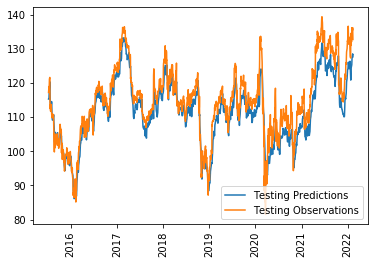

In [55]:
plt.plot(df_test.index, y_pre20)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [56]:
test_results20 = pd.DataFrame(data={'Test Predictions':y_pre20, 'Actuals':y_test},index=df_test.index)
test_results20

,Test Predictions,Actuals
Date,,
2015-07-10,115.283638,117.197418
2015-07-13,115.256409,118.903267
2015-07-14,116.334068,118.362709
2015-07-15,117.469254,118.306519
2015-07-16,118.065956,120.040489
...,...,...
2022-02-07,127.967415,135.606552
2022-02-08,128.362488,135.389175
2022-02-09,128.322693,136.149994


In [57]:
rmse20=np.sqrt(np.mean(((test_results20['Test Predictions']- test_results20['Actuals'])**2)))
mae20 = np.mean(np.abs(test_results20['Test Predictions']-test_results20['Actuals']))
MAPE20 = np.mean(np.abs(((test_results20['Test Predictions']-test_results20['Actuals'])/test_results20['Actuals'])*100))
r2_20 = r2_score(test_results20['Actuals'], test_results20['Test Predictions'])
rmse20, mae20, MAPE20, r2_20

(4.411822240601182, 3.6269199036232105, 3.1295839816883744, 0.8217898107740783)

In [58]:
Create_X_y(3)

([array([[0.40074973, 0.11751924, 0.29800615, 0.28644221, 0.27453328,
          0.65551751, 0.7323172 , 0.62215098],
         [0.381696  , 0.0875191 , 0.30144991, 0.28643911, 0.27604566,
          0.66278378, 0.6605462 , 0.50542608],
         [0.38091832, 0.10328573, 0.30677204, 0.28670875, 0.27627285,
          0.67412444, 0.50444192, 0.38579014],
         [0.38480681, 0.07315615, 0.29988473, 0.28648673, 0.27696616,
          0.6551758 , 0.42271751, 0.38492646],
         [0.38480681, 0.10477902, 0.30489347, 0.28656776, 0.27712503,
          0.66634048, 0.4068408 , 0.45934015],
         [0.37702978, 0.165404  , 0.28360508, 0.28516374, 0.27687357,
          0.60875818, 0.38334822, 0.31759736],
         [0.35680956, 0.16494109, 0.27609143, 0.28325512, 0.27643982,
          0.58944533, 0.34672277, 0.27861237],
         [0.34747713, 0.15947815, 0.26482107, 0.28059319, 0.27477714,
          0.56107614, 0.22684238, 0.11135887],
         [0.33697815, 0.20120807, 0.27358679, 0.27864414, 0.2732

In [59]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 8), (3845, 30, 8), (3845, 1))

In [60]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [61]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3845 samples
Epoch 1/20
3845/3845 [==============================] - 12s 3ms/sample - loss: 0.0177 - mean_absolute_error: 0.0743
Epoch 2/20
3845/3845 [==============================] - 8s 2ms/sample - loss: 6.4076e-04 - mean_absolute_error: 0.0184
Epoch 3/20
3845/3845 [==============================] - 9s 2ms/sample - loss: 4.4087e-04 - mean_absolute_error: 0.0155
Epoch 4/20
3845/3845 [==============================] - 8s 2ms/sample - loss: 4.1685e-04 - mean_absolute_error: 0.0151
Epoch 5/20
3845/3845 [==============================] - 9s 2ms/sample - loss: 3.7462e-04 - mean_absolute_error: 0.0142
Epoch 6/20
3845/3845 [==============================] - 8s 2ms/sample - loss: 3.6796e-04 - mean_absolute_error: 0.0141
Epoch 7/20
3845/3845 [==============================] - 10s 3ms/sample - loss: 3.6177e-04 - mean_absolute_error: 0.0140
Epoch 8/20
3845/3845 [==============================] - 9s 2ms/sample - loss: 3.4724e-04 - mean_absolute_error: 0.0137
Epoch 9/20
3845/3845 [======

In [62]:
inputs = dataset_total[len(dataset_total)-len(df_test)-30:].values
inputs.shape

(1692, 8)

In [63]:
inputs = scaler.transform(inputs)

In [64]:
X_test = []
for i in range(30,len(inputs)):
    X_test.append(inputs[i-30:i, :])

In [65]:
X_test = np.array(X_test)

In [66]:
test_predictions30 = model.predict(X_test)

In [67]:
forecast_copies = np.repeat(test_predictions30, df_scaled.shape[1], axis=-1)
y_pre30 = scaler.inverse_transform(forecast_copies)[:,2]  
y_pre30

array([115.80016, 115.81629, 116.95941, ..., 129.52216, 129.65404,
       128.89014], dtype=float32)

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


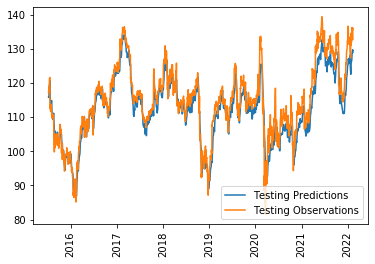

In [68]:
plt.plot(df_test.index, y_pre30)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [69]:
test_results30 = pd.DataFrame(data={'Test Predictions':y_pre30, 'Actuals':y_test},index=df_test.index)
test_results30

,Test Predictions,Actuals
Date,,
2015-07-10,115.800163,117.197418
2015-07-13,115.816292,118.903267
2015-07-14,116.959412,118.362709
2015-07-15,118.126900,118.306519
2015-07-16,118.698853,120.040489
...,...,...
2022-02-07,129.180038,135.606552
2022-02-08,129.563354,135.389175
2022-02-09,129.522156,136.149994


In [70]:
rmse30=np.sqrt(np.mean(((test_results30['Test Predictions']- test_results30['Actuals'])**2)))
mae30 = np.mean(np.abs(test_results30['Test Predictions']-test_results30['Actuals']))
MAPE30 = np.mean(np.abs(((test_results30['Test Predictions']-test_results30['Actuals'])/test_results30['Actuals'])*100))
r2_30 = r2_score(test_results30['Actuals'], test_results30['Test Predictions'])
rmse30, mae30, MAPE30, r2_30

(3.7598845173664874,
 2.9491204217022498,
 2.5567078931142393,
 0.8705668466227826)

In [71]:
Create_X_y(4)

([array([[0.40074973, 0.11751924, 0.29800615, 0.28644221, 0.27453328,
          0.65551751, 0.7323172 , 0.62215098],
         [0.381696  , 0.0875191 , 0.30144991, 0.28643911, 0.27604566,
          0.66278378, 0.6605462 , 0.50542608],
         [0.38091832, 0.10328573, 0.30677204, 0.28670875, 0.27627285,
          0.67412444, 0.50444192, 0.38579014],
         [0.38480681, 0.07315615, 0.29988473, 0.28648673, 0.27696616,
          0.6551758 , 0.42271751, 0.38492646],
         [0.38480681, 0.10477902, 0.30489347, 0.28656776, 0.27712503,
          0.66634048, 0.4068408 , 0.45934015],
         [0.37702978, 0.165404  , 0.28360508, 0.28516374, 0.27687357,
          0.60875818, 0.38334822, 0.31759736],
         [0.35680956, 0.16494109, 0.27609143, 0.28325512, 0.27643982,
          0.58944533, 0.34672277, 0.27861237],
         [0.34747713, 0.15947815, 0.26482107, 0.28059319, 0.27477714,
          0.56107614, 0.22684238, 0.11135887],
         [0.33697815, 0.20120807, 0.27358679, 0.27864414, 0.2732

In [72]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 8), (3815, 60, 8), (3815, 1))

In [73]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [74]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3815 samples
Epoch 1/20
3815/3815 [==============================] - 21s 6ms/sample - loss: 0.0066 - mean_absolute_error: 0.0504
Epoch 2/20
3815/3815 [==============================] - 18s 5ms/sample - loss: 5.8773e-04 - mean_absolute_error: 0.0181
Epoch 3/20
3815/3815 [==============================] - 18s 5ms/sample - loss: 5.1982e-04 - mean_absolute_error: 0.0171
Epoch 4/20
3815/3815 [==============================] - 24s 6ms/sample - loss: 4.3197e-04 - mean_absolute_error: 0.0154
Epoch 5/20
3815/3815 [==============================] - 26s 7ms/sample - loss: 3.6471e-04 - mean_absolute_error: 0.0139
Epoch 6/20
3815/3815 [==============================] - 33s 9ms/sample - loss: 3.4725e-04 - mean_absolute_error: 0.0135
Epoch 7/20
3815/3815 [==============================] - 29s 8ms/sample - loss: 3.4198e-04 - mean_absolute_error: 0.0135
Epoch 8/20
3815/3815 [==============================] - 27s 7ms/sample - loss: 3.0598e-04 - mean_absolute_error: 0.0126
Epoch 9/20
3815/3815 [

In [75]:
inputs = dataset_total[len(dataset_total)-len(df_test)-60:].values

In [76]:
inputs = scaler.transform(inputs)

In [77]:
X_test = []
for i in range(60,len(inputs)):
    X_test.append(inputs[i-60:i, :])

In [78]:
X_test = np.array(X_test)

In [79]:
test_predictions60 = model.predict(X_test)

In [80]:
forecast_copies = np.repeat(test_predictions60, df_scaled.shape[1], axis=-1)
y_pre60 = scaler.inverse_transform(forecast_copies)[:,2]  
y_pre60

array([116.4576  , 116.444695, 117.57682 , ..., 132.06598 , 132.19943 ,
       131.35533 ], dtype=float32)

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


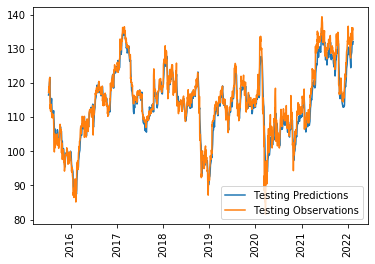

In [81]:
plt.plot(df_test.index, y_pre60)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [82]:
test_results60 = pd.DataFrame(data={'Test Predictions':y_pre60, 'Actuals':y_test},index=df_test.index)
test_results60

,Test Predictions,Actuals
Date,,
2015-07-10,116.457603,117.197418
2015-07-13,116.444695,118.903267
2015-07-14,117.576820,118.362709
2015-07-15,118.724442,118.306519
2015-07-16,119.306816,120.040489
...,...,...
2022-02-07,131.718216,135.606552
2022-02-08,132.117065,135.389175
2022-02-09,132.065979,136.149994


In [83]:
rmse60=np.sqrt(np.mean(((test_results60['Test Predictions']- test_results60['Actuals'])**2)))
mae60 = np.mean(np.abs(test_results60['Test Predictions']-test_results60['Actuals']))
MAPE60 = np.mean(np.abs(((test_results60['Test Predictions']-test_results60['Actuals'])/test_results60['Actuals'])*100))
r2_60 = r2_score(test_results60['Actuals'], test_results60['Test Predictions'])
rmse60, mae60, MAPE60, r2_60

(2.904794814963795, 2.1045538377819226, 1.8542926452843669, 0.9227448497809804)

In [84]:
index_bar = [5,10,20,30,60]

rmse = [rmse5,rmse10,rmse20,rmse30,rmse60]
mae = [mae5,mae10,mae20,mae30,mae60]
MAPE = [MAPE5,MAPE10,MAPE20,MAPE30,MAPE60]
r2 = [r2_5,r2_10,r2_20,r2_30,r2_60]

df_bar = pd.DataFrame(data={'rmse':rmse, 'mae':mae, 'MAPE':MAPE, 'r2':r2},index=index_bar)
df_bar

,rmse,mae,MAPE,r2
5,3.531558,2.728828,2.385750,0.885810
10,4.167377,3.497370,3.036122,0.840991
20,4.411822,3.626920,3.129584,0.821790
30,3.759885,2.949120,2.556708,0.870567
60,2.904795,2.104554,1.854293,0.922745


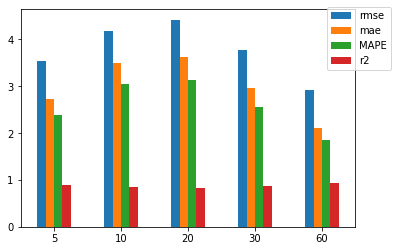

In [85]:
ax = df_bar.plot.bar(rot=0)
ax.legend(loc='best', bbox_to_anchor=(0.9, 0.7))
plt.savefig('Daily DATASET GRANDE PERFORMANCE MATRICS3.png')

In [86]:
### SCELGO 10 GIORNI LOOK BACK

In [87]:
Create_X_y(1)

([array([[0.40074973, 0.11751924, 0.29800615, 0.28644221, 0.27453328,
          0.65551751, 0.7323172 , 0.62215098],
         [0.381696  , 0.0875191 , 0.30144991, 0.28643911, 0.27604566,
          0.66278378, 0.6605462 , 0.50542608],
         [0.38091832, 0.10328573, 0.30677204, 0.28670875, 0.27627285,
          0.67412444, 0.50444192, 0.38579014],
         [0.38480681, 0.07315615, 0.29988473, 0.28648673, 0.27696616,
          0.6551758 , 0.42271751, 0.38492646],
         [0.38480681, 0.10477902, 0.30489347, 0.28656776, 0.27712503,
          0.66634048, 0.4068408 , 0.45934015],
         [0.37702978, 0.165404  , 0.28360508, 0.28516374, 0.27687357,
          0.60875818, 0.38334822, 0.31759736],
         [0.35680956, 0.16494109, 0.27609143, 0.28325512, 0.27643982,
          0.58944533, 0.34672277, 0.27861237],
         [0.34747713, 0.15947815, 0.26482107, 0.28059319, 0.27477714,
          0.56107614, 0.22684238, 0.11135887],
         [0.33697815, 0.20120807, 0.27358679, 0.27864414, 0.2732

In [88]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 8), (3865, 10, 8), (3865, 1))

In [89]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_10 (LSTM)               (None, 10, 100)           43600     
_________________________________________________________________
lstm_11 (LSTM)               (None, 20)                9680      
_________________________________________________________________
dense_10 (Dense)             (None, 25)                525       
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 26        
Total params: 53,831
Trainable params: 53,831
Non-trainable params: 0
_________________________________________________________________


In [90]:
model.fit(X, y, epochs=30, batch_size=64)

Train on 3865 samples
Epoch 1/30
3865/3865 [==============================] - 7s 2ms/sample - loss: 0.0111 - mean_absolute_error: 0.0618
Epoch 2/30
3865/3865 [==============================] - 3s 764us/sample - loss: 5.0062e-04 - mean_absolute_error: 0.0164
Epoch 3/30
3865/3865 [==============================] - 3s 787us/sample - loss: 4.1681e-04 - mean_absolute_error: 0.0149
Epoch 4/30
3865/3865 [==============================] - 3s 765us/sample - loss: 3.7680e-04 - mean_absolute_error: 0.0141
Epoch 5/30
3865/3865 [==============================] - 3s 768us/sample - loss: 3.7508e-04 - mean_absolute_error: 0.0141
Epoch 6/30
3865/3865 [==============================] - 3s 762us/sample - loss: 3.4162e-04 - mean_absolute_error: 0.0133
Epoch 7/30
3865/3865 [==============================] - 3s 769us/sample - loss: 3.3601e-04 - mean_absolute_error: 0.0133
Epoch 8/30
3865/3865 [==============================] - 3s 759us/sample - loss: 3.1590e-04 - mean_absolute_error: 0.0128
Epoch 9/30
3865/

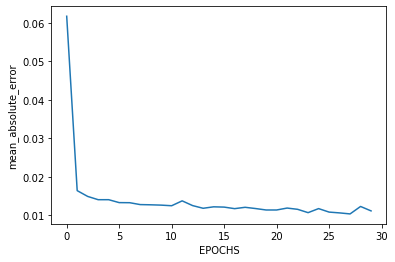

In [91]:
loss_per_epoch = model.history.history['mean_absolute_error']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)
plt.xlabel('EPOCHS')
plt.ylabel('mean_absolute_error')
plt.savefig('DATASET GRANDE mean absolute error (buono).png')

In [92]:
from datetime import datetime
a = [5,10,20,30]
minutes = []
for i in a:
    start_time = datetime.now()
    model.fit(X, y, epochs=i, batch_size=64)
    end_time = datetime.now()
    minutes.append(end_time - start_time)

Train on 3865 samples
Epoch 1/5
3865/3865 [==============================] - 5s 1ms/sample - loss: 2.0271e-04 - mean_absolute_error: 0.0103
Epoch 2/5
3865/3865 [==============================] - 5s 1ms/sample - loss: 2.0258e-04 - mean_absolute_error: 0.0103
Epoch 3/5
3865/3865 [==============================] - 4s 1ms/sample - loss: 1.9954e-04 - mean_absolute_error: 0.0103
Epoch 4/5
3865/3865 [==============================] - 5s 1ms/sample - loss: 1.9837e-04 - mean_absolute_error: 0.0103
Epoch 5/5
3865/3865 [==============================] - 4s 1ms/sample - loss: 2.2246e-04 - mean_absolute_error: 0.0109
Train on 3865 samples
Epoch 1/10
3865/3865 [==============================] - 6s 2ms/sample - loss: 2.3262e-04 - mean_absolute_error: 0.0114
Epoch 2/10
3865/3865 [==============================] - 4s 1ms/sample - loss: 1.9169e-04 - mean_absolute_error: 0.0101
Epoch 3/10
3865/3865 [==============================] - 4s 1ms/sample - loss: 1.9256e-04 - mean_absolute_error: 0.0101
Epoch 4/1

In [93]:
epochs = [5,10,20,30]

df_epoch = pd.DataFrame(data={'Epoch':epochs},index=minutes)
df_epoch

,Epoch
0 days 00:00:23.308368,5
0 days 00:01:00.082992,10
0 days 00:02:01.535030,20
0 days 00:02:31.832801,30


In [94]:
import datetime
time_sec = []
for i in df_epoch.index:
    a = i.total_seconds()
    time_sec.append(a)


In [95]:
time_sec

[23.308368, 60.082992, 121.53503, 151.832801]

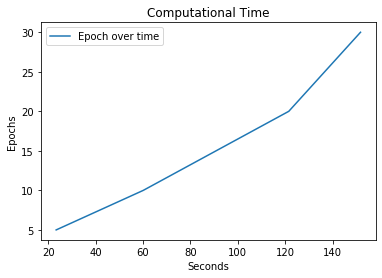

In [96]:
plt.plot(time_sec, epochs)
plt.xlabel('Seconds')
plt.ylabel('Epochs')
plt.title('Computational Time')
plt.legend(['Epoch over time'])
plt.savefig('DATASET GRANDE epochs vs time.png')

In [97]:
## SCELGO 20 EPOCHS

In [98]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 10, 100)           43600     
_________________________________________________________________
lstm_13 (LSTM)               (None, 20)                9680      
_________________________________________________________________
dense_12 (Dense)             (None, 25)                525       
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 26        
Total params: 53,831
Trainable params: 53,831
Non-trainable params: 0
_________________________________________________________________


In [99]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3865 samples
Epoch 1/20
3865/3865 [==============================] - 8s 2ms/sample - loss: 0.0262 - mean_absolute_error: 0.0936
Epoch 2/20
3865/3865 [==============================] - 4s 1ms/sample - loss: 8.0534e-04 - mean_absolute_error: 0.0218
Epoch 3/20
3865/3865 [==============================] - 4s 1ms/sample - loss: 5.8436e-04 - mean_absolute_error: 0.0183
Epoch 4/20
3865/3865 [==============================] - 5s 1ms/sample - loss: 5.0339e-04 - mean_absolute_error: 0.0167
Epoch 5/20
3865/3865 [==============================] - 4s 1ms/sample - loss: 4.8118e-04 - mean_absolute_error: 0.0162
Epoch 6/20
3865/3865 [==============================] - 5s 1ms/sample - loss: 4.2174e-04 - mean_absolute_error: 0.0150
Epoch 7/20
3865/3865 [==============================] - 6s 2ms/sample - loss: 4.0719e-04 - mean_absolute_error: 0.0148
Epoch 8/20
3865/3865 [==============================] - 5s 1ms/sample - loss: 3.8065e-04 - mean_absolute_error: 0.0142
Epoch 9/20
3865/3865 [========

In [100]:
dataset_total = pd.concat((df_train,df_test), axis=0)

In [101]:
inputs = dataset_total[len(dataset_total)-len(df_test)-10:].values
inputs.shape

(1672, 8)

In [102]:
inputs = scaler.transform(inputs)

In [103]:
X_test = []
for i in range(10,len(inputs)):
    X_test.append(inputs[i-10:i, :])

In [104]:
X_test = np.array(X_test)

In [105]:
test_predictions10 = model.predict(X_test)

In [106]:
forecast_copies = np.repeat(test_predictions10, df_scaled.shape[1], axis=-1)
y_pre10 = scaler.inverse_transform(forecast_copies)[:,2]  
y_pre10

array([115.0947  , 114.752365, 115.4679  , ..., 129.09384 , 129.30074 ,
       128.5264  ], dtype=float32)

In [107]:
y_test = df_test['Adj Close'].values

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


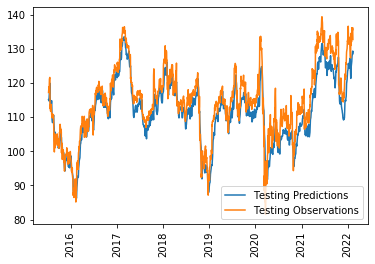

In [108]:
plt.plot(df_test.index, y_pre10)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])
#plt.savefig('Dataset grande.png')

In [109]:
test_results10 = pd.DataFrame(data={'Test Predictions':y_pre10, 'Actuals':y_test},index=df_test.index)
test_results10

,Test Predictions,Actuals
Date,,
2015-07-10,115.094704,117.197418
2015-07-13,114.752365,118.903267
2015-07-14,115.467903,118.362709
2015-07-15,116.643822,118.306519
2015-07-16,117.454788,120.040489
...,...,...
2022-02-07,128.599396,135.606552
2022-02-08,129.154984,135.389175
2022-02-09,129.093842,136.149994


In [110]:
from sklearn.metrics import r2_score
rmse10=np.sqrt(np.mean(((test_results10['Test Predictions']- test_results10['Actuals'])**2)))
mae10 = np.mean(np.abs(test_results10['Test Predictions']-test_results10['Actuals']))
MAPE10 = np.mean(np.abs(((test_results10['Test Predictions']-test_results10['Actuals'])/test_results10['Actuals'])*100))
r2_10 = r2_score(test_results10['Actuals'], test_results10['Test Predictions'])
rmse10, mae10, MAPE10, r2_10

(4.50739960243381, 3.699948637924469, 3.201132008380811, 0.8139847098203284)

In [111]:
prezzo = []
for i in test_results10['Actuals']:
    prezzo.append(i)

strategy_act=[]
i=1
while i < len(prezzo):
    if prezzo[i]>prezzo[i-1]:
        strategy_act.append(1)
    else:
        strategy_act.append(-1)
    i=i+1

In [112]:
prezzo_pre = []
for i in test_results10['Test Predictions']:
    prezzo_pre.append(i) 

strategy_pre=[]
i=1
while i < len(prezzo_pre):
    if prezzo_pre[i]>prezzo_pre[i-1]:
        strategy_pre.append(1)
    else:
        strategy_pre.append(-1)
    i=i+1

In [113]:
test_results10 = test_results10[1:]

In [114]:
test_results10['Strategy Pre'] = strategy_pre

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [115]:
test_results10['Strategy Act'] = strategy_act

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [116]:
test_results10

,Test Predictions,Actuals,Strategy Pre,Strategy Act
Date,,,,
2015-07-13,114.752365,118.903267,-1,1
2015-07-14,115.467903,118.362709,1,-1
2015-07-15,116.643822,118.306519,1,-1
2015-07-16,117.454788,120.040489,1,1
2015-07-17,118.226524,121.100502,1,1
...,...,...,...,...
2022-02-07,128.599396,135.606552,1,1
2022-02-08,129.154984,135.389175,1,-1
2022-02-09,129.093842,136.149994,-1,1


In [117]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_results10['Strategy Act'], test_results10['Strategy Pre'])
cm

array([[362, 430],
       [418, 451]])

In [118]:
from sklearn.metrics import accuracy_score, precision_score, recall_score
print(accuracy_score(test_results10['Strategy Act'], test_results10['Strategy Pre']))
print(precision_score(test_results10['Strategy Act'], test_results10['Strategy Pre']))
print(recall_score(test_results10['Strategy Act'], test_results10['Strategy Pre']))

0.48946417820590005
0.5119182746878547
0.5189873417721519


In [119]:
test_results10

,Test Predictions,Actuals,Strategy Pre,Strategy Act
Date,,,,
2015-07-13,114.752365,118.903267,-1,1
2015-07-14,115.467903,118.362709,1,-1
2015-07-15,116.643822,118.306519,1,-1
2015-07-16,117.454788,120.040489,1,1
2015-07-17,118.226524,121.100502,1,1
...,...,...,...,...
2022-02-07,128.599396,135.606552,1,1
2022-02-08,129.154984,135.389175,1,-1
2022-02-09,129.093842,136.149994,-1,1


In [120]:
### IL MIGLIORE TRA I 4 DATASET E QUELLO GRANDE (accuracy più alta)

In [121]:
len(test_results10)

1661

In [136]:
df_andrea = test_results10[['Strategy Pre']]

In [137]:
df_andrea

,Strategy Pre
Date,
2015-07-13,-1
2015-07-14,1
2015-07-15,1
2015-07-16,1
2015-07-17,1
...,...
2022-02-07,1
2022-02-08,1
2022-02-09,-1


In [144]:
df_andrea.to_csv('ANDRE.csv')

In [124]:
#start of test period
starttest = 80
#end of test period
endtest = 800

In [125]:
Date = test_results10.index

In [126]:
tradingprices = test_results10['Actuals'] ##come si muovono realmente i prezzi 

In [127]:
realtraders = test_results10['Strategy Pre'] ## la mia strategia predetta (short long)

In [128]:
len(Date), len(tradingprices),len(realtraders)

(1661, 1661, 1661)

In [129]:
profit = np.zeros(len(tradingprices))
profit[0] = tradingprices[0]
for i in range(1,len(tradingprices)):
    if realtraders[i]-realtraders[i-1]==0:
        profit[i]=profit[i-1]
    else:
        profit[i]=tradingprices[i]

In [130]:
percentage = np.zeros(len(tradingprices))
percentage[0] = 0
for i in range(1,len(tradingprices)):
    if profit[i]!=profit[i-1]:
        percentage[i]=0
    else:
        percentage[i] = realtraders[i]*100*(tradingprices[i]/profit[i] -1)

In [131]:
percentagelong = np.zeros(len(tradingprices))
percentageshort = np.zeros(len(tradingprices))
for i in range(len(tradingprices)):
    if realtraders[i]-realtraders[i-1]==-2:
        percentagelong[i]=100*(tradingprices[i]/profit[i-1] -1)
    if realtraders[i]-realtraders[i-1]==2:
        percentageshort[i]=100*(profit[i-1]/tradingprices[i] -1)
percentagelongshort = np.column_stack((percentagelong,percentageshort))
Percentage = np.column_stack((percentage,percentagelong,percentageshort))

In [ ]:
Generale1 = np.zeros(len(tradingprices))
Generale2 = np.zeros(len(tradingprices))
Generale3 = np.zeros(len(tradingprices))

Long1 = np.zeros(len(tradingprices))
Long2 = np.zeros(len(tradingprices))
Long3 = np.zeros(len(tradingprices))

Short1 = np.zeros(len(tradingprices))
Short2 = np.zeros(len(tradingprices))
Short3 = np.zeros(len(tradingprices))

for i in range(len(tradingprices)):
    Generale1[i] = np.sum(percentagelongshort[:i+1,:])
    Long1[i] = np.sum(percentagelong[:i+1])
    Short1[i] = np.sum(percentageshort[:i+1])
for i in range(1,len(tradingprices)):
    Generale2[i] = max(Generale1[i],Generale2[i-1])
    Long2[i] = max(Long1[i],Long2[i-1])
    Short2[i] = max(Short1[i],Short2[i-1])
for i in range(len(tradingprices)):
    Generale3[i] = Generale1[i]-Generale2[i]
    Long3[i] = Long1[i]-Long2[i]
    Short3[i] = Short1[i]-Short2[i]
    
Generale = np.column_stack((Generale1,Generale2,Generale3))
Long = np.column_stack((Long1,Long2,Long3))
Short = np.column_stack((Short1,Short2,Short3))

In [132]:
def MaximumDrawdown(start,end):
    return np.min(Percentage[start:end+1,:])

In [133]:
def Performance(start,end):
    return np.sum(percentagelongshort[start:end+1,:]+percentage[end]-percentage[start])

In [134]:
def gross_profit(vector):
    c = 0
    for v in vector:
        if v>0:
            c+=v
    return c

def gross_loss(vector):
    c = 0
    for v in vector:
        if v<0:
            c+=v
    return c

def winning_trades(vector):
    c = 0
    for v in vector:
        if v>0:
            c+=1
    return c

def losing_trades(vector):
    c = 0
    for v in vector:
        if v<0:
            c+=1
    return c

In [135]:
sheet2 = np.zeros((19,3))

#percentage parameter
parameter = 100

#number of weeks in a year
week = 52

#number winning trades long
sheet2[2,1] = winning_trades(percentagelong[starttest:endtest])

#number losing trades long
sheet2[3,1] = losing_trades(percentagelong[starttest:endtest])

#number winning trades short
sheet2[2,2] = winning_trades(percentageshort[starttest:endtest])

#number losing trades short
sheet2[3,2] = losing_trades(percentageshort[starttest:endtest])

#number winning trades
sheet2[2,0] = sheet2[2,1] + sheet2[2,2]

#number losing trades
sheet2[3,0] = sheet2[3,1] + sheet2[3,2]

#number of trades long
sheet2[1,1] = sheet2[2,1] + sheet2[3,1]

#number of trades short
sheet2[1,2] = sheet2[2,2] + sheet2[3,2]

#total number of trades
sheet2[1,0] = sheet2[1,1] + sheet2[1,2]

#gross profit long
sheet2[4,1] = gross_profit(percentagelong[starttest:endtest])

#gross loss long
sheet2[5,1] = gross_loss(percentagelong[starttest:endtest])

#gross profit short
sheet2[4,2] = gross_profit(percentageshort[starttest:endtest])

#gross loss short
sheet2[5,2] = gross_loss(percentageshort[starttest:endtest])

#total gross profit
sheet2[4,0] = sheet2[4,1] + sheet2[4,2]

#total gross loss
sheet2[5,0] = sheet2[5,1] + sheet2[5,2]

#total profit long
sheet2[0,1] = sheet2[4,1] + sheet2[5,1]

#total profit short
sheet2[0,2] = sheet2[4,2] + sheet2[5,2]

#total profit 
sheet2[0,0] = sheet2[0,1] + sheet2[0,2]

#average winners long
sheet2[6,1] = sheet2[4,1]/sheet2[2,1]

#average winners short
sheet2[6,2] = sheet2[4,2]/sheet2[2,2]

#average winners all
sheet2[6,0] = sheet2[4,0]/sheet2[2,0]

#average losers long
sheet2[7,1] = sheet2[5,1]/sheet2[3,1]

#average losers short
sheet2[7,2] = sheet2[5,2]/sheet2[3,2]

#average losers all
sheet2[7,0] = sheet2[5,0]/sheet2[3,0]

#profit factor long 
sheet2[8,1] = abs(sheet2[4,1]/sheet2[5,1])

#profit factor short
sheet2[8,2] = abs(sheet2[4,2]/sheet2[5,2])

#profit factor all
sheet2[8,0] = abs(sheet2[4,0]/sheet2[5,0])

# % winning all
sheet2[9,0] = abs((sheet2[3,0]*parameter)/(sheet2[2,0]+sheet2[3,0])-parameter)

# % winning long
sheet2[9,1] = abs((sheet2[3,1]*parameter)/(sheet2[2,1]+sheet2[3,1])-parameter)

# % winning short
sheet2[9,2] = abs((sheet2[3,2]*parameter)/(sheet2[2,2]+sheet2[3,2])-parameter)

# % losing all
sheet2[10,0] = parameter - sheet2[9,0]

# % losing long
sheet2[10,1] = parameter - sheet2[9,1]

# % losing short
sheet2[10,2] = parameter - sheet2[9,2]

# Drawdown all
sheet2[11,0] = min(Generale3[starttest:endtest])

# Drawdown long
sheet2[11,1] = min(Long3[starttest:endtest])

# Drawdown short
sheet2[11,2] = min(Short3[starttest:endtest])

# Drawdown length index all
sheet2[12,0] = gross_loss(Generale3[starttest:endtest])/week

# Drawdown length index long
sheet2[12,1] = gross_loss(Long3[starttest:endtest])/week

# Drawdown length index short
sheet2[12,2] = gross_loss(Short3[starttest:endtest])/week

#Weeks of trading long
sheet2[13,1] = winning_trades(realtraders[starttest:endtest])

#Weeks of trading short
sheet2[13,2] = losing_trades(realtraders[starttest:endtest])

#Weeks of trading all
sheet2[13,0] = sheet2[13,1] + sheet2[13,2]

#average daily gain all
sheet2[14,0] = sheet2[0,0]/sheet2[13,0]

#average daily gain long
sheet2[14,1] = sheet2[0,1]/sheet2[13,1]

#average daily gain short
sheet2[14,2] = sheet2[0,2]/sheet2[13,2]

#trades average gain all
sheet2[15,0] = sheet2[0,0]/sheet2[1,0]

#trades average gain long
sheet2[15,1] = sheet2[0,1]/sheet2[1,1]

#trades average gain short
sheet2[15,2] = sheet2[0,2]/sheet2[1,2]

# % on market
sheet2[16,0] = (sheet2[13,1] + sheet2[13,2])/sheet2[13,0]

sheet2[16,1] = np.nan

sheet2[16,2] = np.nan

# frequency trades per year
sheet2[17,0] = sheet2[1,0]/(sheet2[13,0]/week)

sheet2[17,1] = np.nan

sheet2[17,2] = np.nan

#Average yearly gain all
sheet2[18,0] = sheet2[14,0]*week

#Average yearly gain long
sheet2[18,1] = sheet2[14,1]*week

##Average yearly gain short
sheet2[18,2] = sheet2[14,2]*week

NameError: name 'Generale3' is not defined

In [ ]:
SHEET2 = pd.DataFrame(sheet2)
SHEET2.columns = ['All','Long','Short']
SHEET2.index = ['Total Profit','Number of Trades','Number winning Trades','Number losing Trades','Gross Profit','Gross Loss','Average winners','Average losers','Profit Factor','% winning','% losing','Drawdown','Drawdown length index','Weeks of trading','Average daily gain','Trades average gain','% on market','Frequency trades/year','Average yearly gain']
SHEET2

In [ ]:
x = np.linspace(1,len(Generale1[starttest:endtest]),len(Generale1[starttest:endtest]),dtype='int')
line= np.linspace(200,800,4,dtype='int')
fig = plt.figure(figsize=(18,15))
ax = fig.add_subplot(111)
ax.set_ylabel('Gain',fontweight ='bold',fontsize=20)
ax.set_xlabel('Time',fontweight ='bold',fontsize=20)
ax.set_title('LUISS Algorithm test',fontweight ='bold',fontsize=20)
plt.plot(x,Generale2[starttest:endtest], alpha=0.2, color='r',linewidth=10,linestyle = '-', label = 'Maximum Performance')
for l in line:
    plt.axhline(y = l, color = 'black', linestyle = '-',linewidth=1)
plt.plot(x,Generale1[starttest:endtest], alpha=0.2, color='black',linewidth=1.5, label = 'General Equity')
plt.plot(x,Long1[starttest:endtest], alpha=0.2, color='green',linewidth=3, label = 'Long Equity')
plt.plot(x,Short1[starttest:endtest], alpha=0.2, color='red',linewidth=3, label = 'Short Equity')
ax.fill_between(x, Generale1[starttest:endtest], 0, color='blue', alpha=.1)

ax.legend()